<a href="https://colab.research.google.com/github/SumayyahAli/Getting_Started_with_CUDA/blob/main/YOLO_AI_for_drones.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Images

In [ ]:
from PIL import Image, ImageEnhance, ImageOps, ImageFilter
import matplotlib.pyplot as plt
import numpy as np


# Load an image
image_path = '/content/Featured-image-Riyadh-city-and-Kingdom-Centre-Tower.jpg'  # Change this to the path of your image
image = Image.open(image_path)

# Function to display images before and after transformation
def display_images(before, after, title_before='Before', title_after='After'):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(before)
    axes[0].set_title(title_before)
    axes[0].axis('off')
    axes[1].imshow(after)
    axes[1].set_title(title_after)
    axes[1].axis('off')
    plt.show()

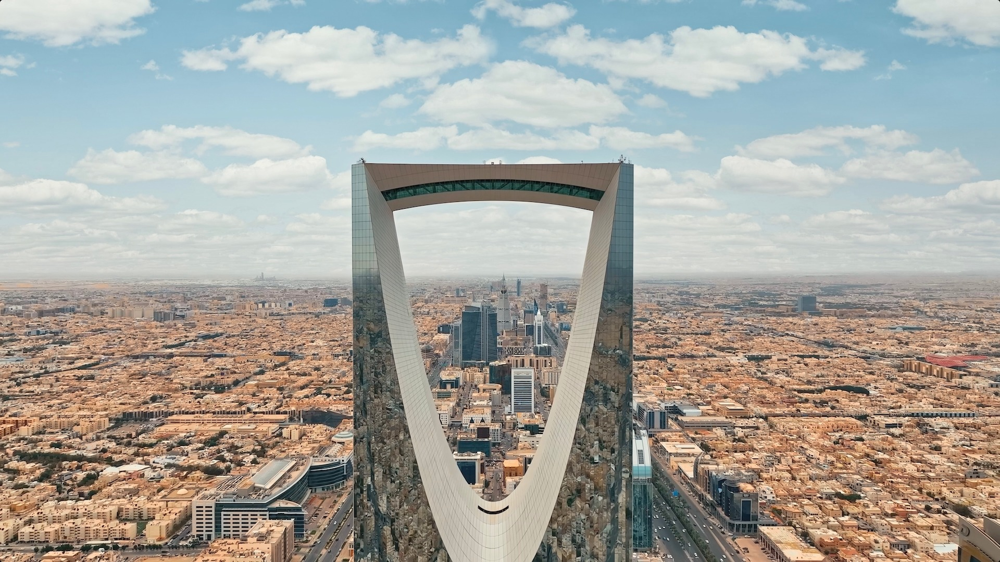

In [ ]:
image

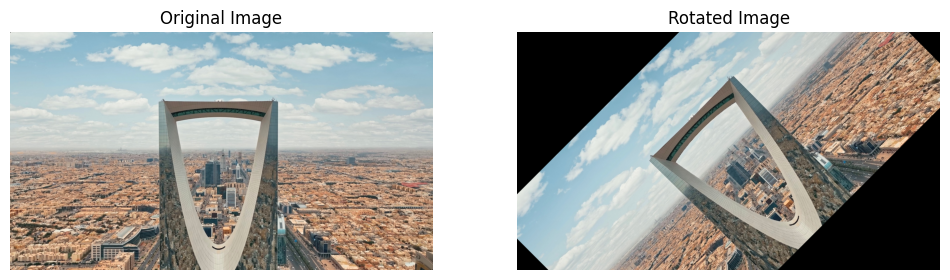

In [ ]:
# 1. Rotate an image
rotated_image = image.rotate(45)  # Rotate the image by 45 degrees
display_images(image, rotated_image, 'Original Image', 'Rotated Image')

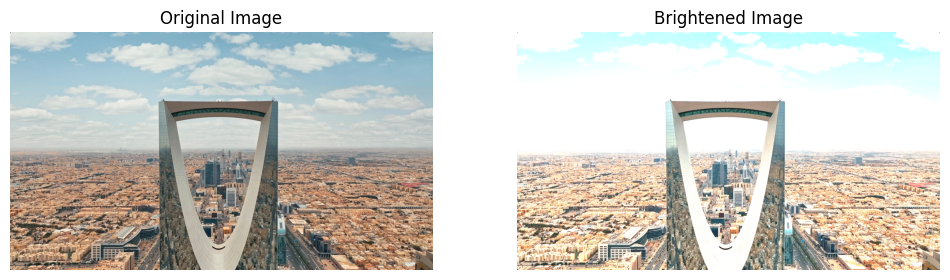

In [ ]:
# 2. Change the brightness of an image
enhancer = ImageEnhance.Brightness(image)
bright_image = enhancer.enhance(1.5)  # Increase brightness by 50%
display_images(image, bright_image, 'Original Image', 'Brightened Image')


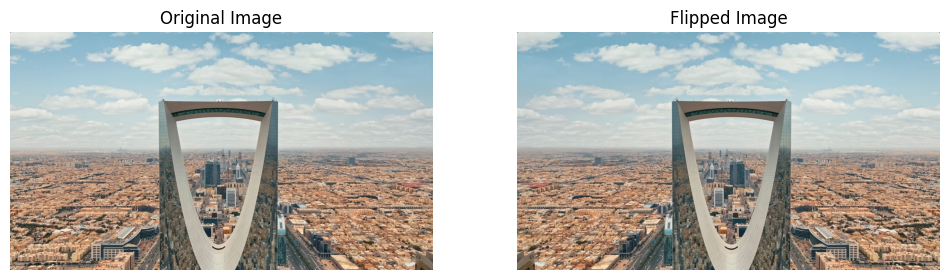

In [ ]:
# 3. Flip an image
flipped_image = ImageOps.mirror(image)  # Flip the image horizontally
display_images(image, flipped_image, 'Original Image', 'Flipped Image')

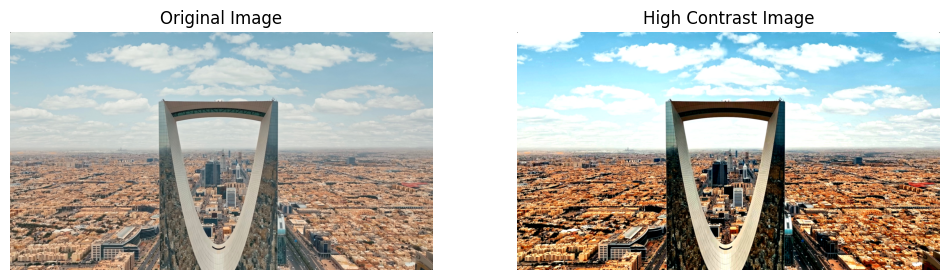

In [ ]:
# 4. Change the contrast of an image
enhancer = ImageEnhance.Contrast(image)
contrast_image = enhancer.enhance(2.0)  # Increase contrast by 100%
display_images(image, contrast_image, 'Original Image', 'High Contrast Image')

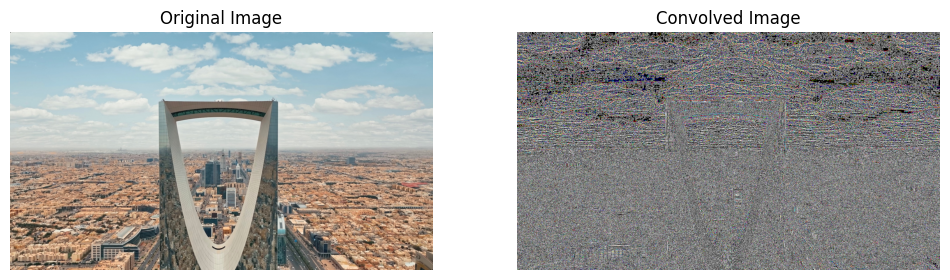

In [ ]:
# 5. Convolving operation with an image (applying a blur filter)
from scipy.ndimage import convolve
image_np = np.array(image)

kernel = np.array([[-1, -1, -1],
                   [-1, 8, -1],
                   [-1, -1, -1]])

# Apply the custom convolution to each channel independently and then stack them back together
convolved_image_np = np.stack([convolve(image_np[:, :, i], kernel) for i in range(3)], axis=2)

# Convert the convolved image back to a PIL image
convolved_image = Image.fromarray(np.clip(convolved_image_np, 0, 255).astype('uint8'))

# Display the original and convolved images
display_images(image, convolved_image, 'Original Image', 'Convolved Image')

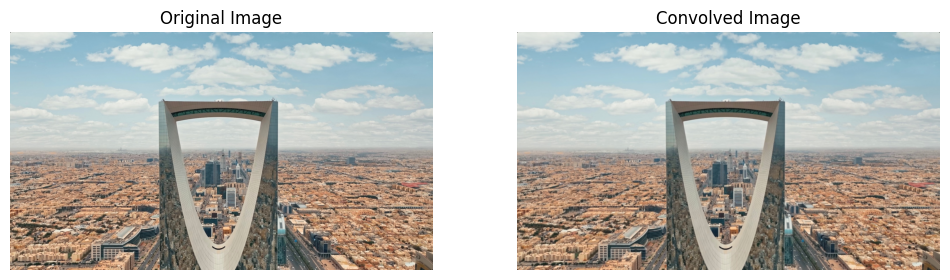

In [ ]:
from scipy.ndimage import convolve
image_np = np.array(image)

kernel = np.array([[1/9, 1/9, 1/9],
                   [1/9, 1/9, 1/9],
                   [1/9, 1/9, 1/9]])

# Apply the custom convolution to each channel independently and then stack them back together
convolved_image_np = np.stack([convolve(image_np[:, :, i], kernel) for i in range(3)], axis=2)

# Convert the convolved image back to a PIL image
convolved_image = Image.fromarray(np.clip(convolved_image_np, 0, 255).astype('uint8'))

# Display the original and convolved images
display_images(image, convolved_image, 'Original Image', 'Convolved Image')

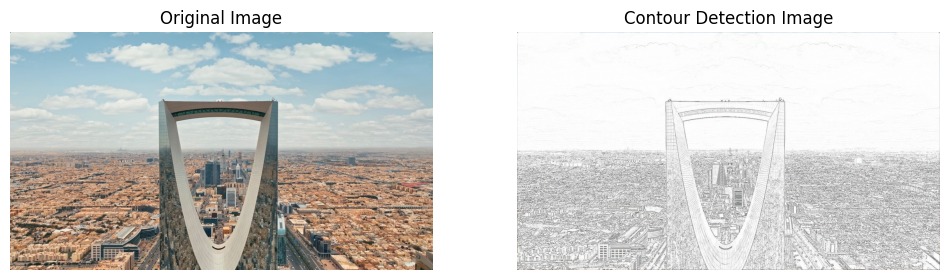

In [ ]:
convolved_image = image.filter(ImageFilter.CONTOUR)  # Apply a blur filter
display_images(image, convolved_image, 'Original Image', 'Contour Detection Image')

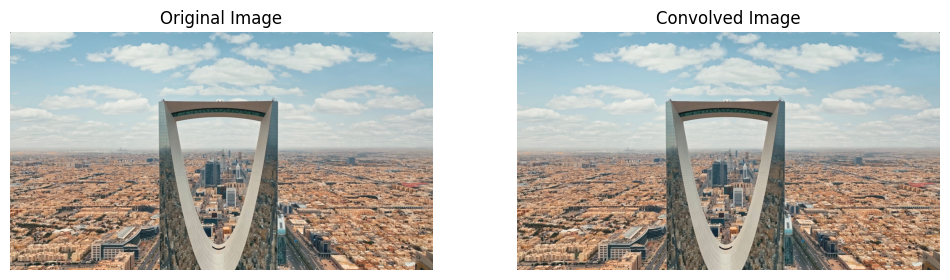

In [ ]:
image_np = np.array(image)

# Define the contour (Laplacian) kernel
contour_kernel = np.array([[0, 0, 0],
                           [0, 1, 0],
                           [0, 0, 0]])

# Apply the contour kernel
contour_image_np = np.stack([convolve(image_np[:, :, i], contour_kernel) for i in range(3)], axis=2)
contour_image = Image.fromarray(np.clip(contour_image_np, 0, 255).astype('uint8'))

# Display the original and contour images
display_images(image, contour_image, 'Original Image', 'Convolved Image')

RGB Image Shape: (1080, 1920, 3)
Grayscale Image Shape: (1080, 1920)


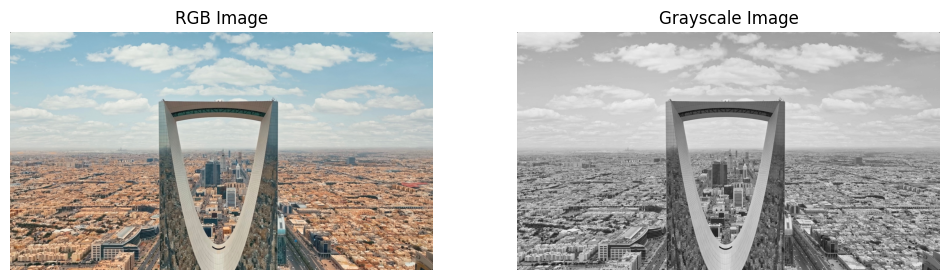

In [ ]:
gray_image = image.convert('L')

# Display the shape of the RGB and grayscale images
rgb_shape = np.array(image).shape
gray_shape = np.array(gray_image).shape

print(f"RGB Image Shape: {rgb_shape}")
print(f"Grayscale Image Shape: {gray_shape}")

# Display the RGB and grayscale images side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image)
axes[0].set_title('RGB Image')
axes[0].axis('off')
axes[1].imshow(gray_image,cmap=plt.get_cmap('gray'))
axes[1].set_title('Grayscale Image')
axes[1].axis('off')
plt.show()

# YOLO

In [ ]:
%%capture
!pip install ultralytics

In [ ]:
# main code to run YOLO training
from ultralytics import YOLO

# Load a model
#model = YOLO("yolov8n.yaml")  # build a new model from scratch
model = YOLO("yolov8n.pt")     # load a pretrained model (recommended for training)

100%|██████████| 6.25M/6.25M [00:00<00:00, 86.2MB/s]


In [ ]:
output = model.predict("/content/Improving-the-Office-365-app-experience-in-virtual-environments-SOCIAL.png")


image 1/1 /content/Improving-the-Office-365-app-experience-in-virtual-environments-SOCIAL.png: 352x640 1 person, 1 chair, 1 laptop, 144.9ms
Speed: 13.2ms preprocess, 144.9ms inference, 1059.5ms postprocess per image at shape (1, 3, 352, 640)


In [ ]:
classes = output[0].names

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
img = cv2.imread("/content/Improving-the-Office-365-app-experience-in-virtual-environments-SOCIAL.png")

In [ ]:
boxes = output[0].boxes.xyxy

In [ ]:
boxes

tensor([[  2.2374,   5.7813, 820.0125, 623.1942],
        [583.2977, 350.3607, 986.3770, 618.3599],
        [  0.0000, 144.9068,  45.4769, 466.7518]], device='cuda:0')

In [ ]:
boxes.shape[0]

3

In [ ]:
for i in range(boxes.shape[0]):
    img = cv2.rectangle(img=img,pt1=(int(boxes[i,0]),int(boxes[i,1])),pt2=(int(boxes[i,2]),int(boxes[i,3])),color=(0,255,0),thickness=2)
    img = cv2.putText(img,classes[int(output[0].boxes.cls[i])],(int(boxes[i,0]),int(boxes[i,1])),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,0),2)

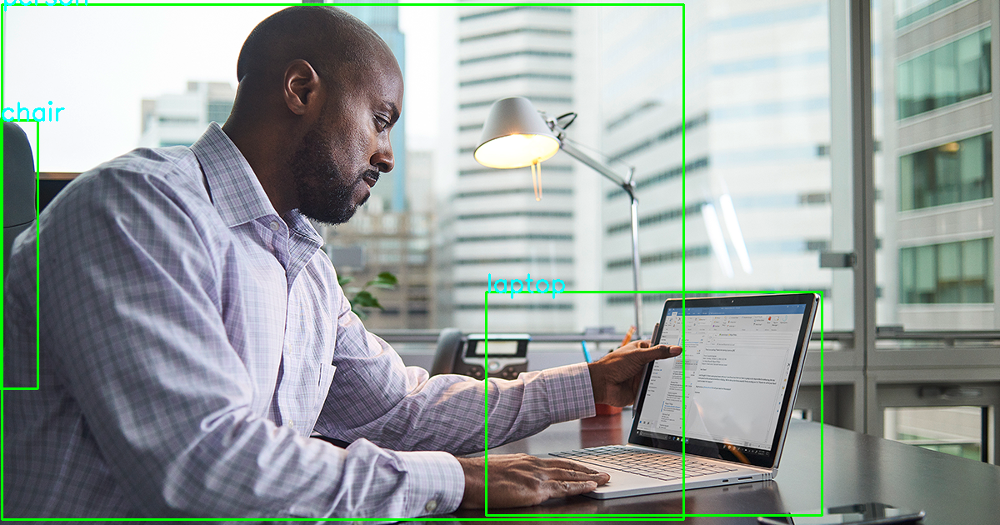

In [ ]:
cv2_imshow(img)

## This is a custome dataset yaml

You should create a yaml file and fill the needed parameters:
1. dataset root directory path
2. train text file path
3. validation text file path
4. test text file path (optional)
5. the classes

```ymal
path: <path to dataset root directory> # dataset root dir
train: <path to train images txt file>  example (train2017.txt) # train images (relative to 'path')
val: <path to val images txt file>  example (val2017.txt) # val images (relative to 'path')
test: <path to test images txt file>  example (test-dev2017.txt) # test images

# Classes
names:
  0: person
  1: bicycle
  2: car
  3: motorcycle
  4: airplane
  5: bus
  6: train
  7: truck
  8: boat
  9: traffic light
  10: fire hydrant
  11: stop sign
  12: parking meter
  13: bench
  14: bird
  15: cat
  16: dog
  17: horse
  18: sheep
  19: cow
  20: elephant
  21: bear
  22: zebra
  23: giraffe
  24: backpack
  25: umbrella
  26: handbag
  27: tie
  28: suitcase
  29: frisbee
  30: skis
  31: snowboard
  32: sports ball
  33: kite
  34: baseball bat
  35: baseball glove
  36: skateboard
  37: surfboard
  38: tennis racket
  39: bottle
  40: wine glass
  41: cup
  42: fork
  43: knife
  44: spoon
  45: bowl
  46: banana
  47: apple
  48: sandwich
  49: orange
  50: broccoli
  51: carrot
  52: hot dog
  53: pizza
  54: donut
  55: cake
  56: chair
  57: couch
  58: potted plant
  59: bed
  60: dining table
  61: toilet
  62: tv
  63: laptop
  64: mouse
  65: remote
  66: keyboard
  67: cell phone
  68: microwave
  69: oven
  70: toaster
  71: sink
  72: refrigerator
  73: book
  74: clock
  75: vase
  76: scissors
  77: teddy bear
  78: hair drier
  79: toothbrush
```

In [ ]:
!wget http://images.cocodataset.org/zips/train2017.zip
!wget http://images.cocodataset.org/zips/test2017.zip
!wget http://images.cocodataset.org/zips/val2017.zip

--2024-07-26 14:13:55--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.28.147, 52.216.208.41, 52.216.162.3, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.28.147|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

train2017.zip       100%[===================>]  18.01G  31.6MB/s    in 10m 1s  

2024-07-26 14:23:56 (30.7 MB/s) - ‘train2017.zip’ saved [19336861798/19336861798]

--2024-07-26 14:23:57--  http://images.cocodataset.org/zips/test2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.182.41.145, 3.5.6.124, 54.231.163.185, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.182.41.145|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6646970404 (6.2G) [application/zip]
Saving to: ‘test2017.zip’

test2017.zip        100%[===================>]   6.19G

In [ ]:
!mkdir dataset

In [ ]:
%%capture
!unzip train2017.zip -d dataset
!unzip test2017.zip -d dataset
!unzip val2017.zip -d dataset

In [ ]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip

--2024-07-26 14:32:45--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.25.110, 54.231.160.201, 52.216.60.249, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.25.110|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  28.9MB/s    in 25s     

2024-07-26 14:33:10 (9.58 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]



In [ ]:
!unzip annotations_trainval2017.zip -d dataset

Archive:  annotations_trainval2017.zip
  inflating: dataset/annotations/instances_train2017.json  
  inflating: dataset/annotations/instances_val2017.json  
  inflating: dataset/annotations/captions_train2017.json  
  inflating: dataset/annotations/captions_val2017.json  
  inflating: dataset/annotations/person_keypoints_train2017.json  
  inflating: dataset/annotations/person_keypoints_val2017.json  


In [ ]:
!wget http://images.cocodataset.org/annotations/image_info_test2017.zip

--2024-07-26 14:33:20--  http://images.cocodataset.org/annotations/image_info_test2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 54.231.129.17, 3.5.27.97, 52.216.29.228, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|54.231.129.17|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1144034 (1.1M) [application/zip]
Saving to: ‘image_info_test2017.zip’

image_info_test2017 100%[===================>]   1.09M  3.01MB/s    in 0.4s    

2024-07-26 14:33:20 (3.01 MB/s) - ‘image_info_test2017.zip’ saved [1144034/1144034]



In [ ]:
!unzip image_info_test2017.zip -d dataset

Archive:  image_info_test2017.zip
  inflating: dataset/annotations/image_info_test-dev2017.json  
  inflating: dataset/annotations/image_info_test2017.json  


In [ ]:
!pip3 install pycocotools requests click

In [ ]:
!git clone https://github.com/tw-yshuang/coco2yolo.git

Cloning into 'coco2yolo'...
remote: Enumerating objects: 93, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 93 (delta 0), reused 3 (delta 0), pack-reused 89
Receiving objects: 100% (93/93), 43.73 KiB | 426.00 KiB/s, done.
Resolving deltas: 100% (45/45), done.


In [ ]:
!chmod +x coco2yolo

In [ ]:
classes = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
classes = ['"'+i+'"' for i in classes]

In [ ]:
!python coco2yolo/coco2yolo \
  -ann-path /content/dataset/annotations/instances_val2017.json \
  -img-dir /content/dataset/val2017 \
  -task-dir /content/dataset/val \
  {' '.join(classes)}

loading annotations into memory...
Done (t=1.13s)
creating index...
index created!
COCO categories: 
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']

['person', 'bicycle', 'car', 'motorc

In [ ]:
!python coco2yolo/coco2yolo \
  -ann-path /content/dataset/annotations/instances_train2017.json \
  -img-dir /content/dataset/train2017 \
  -task-dir /content/dataset/train \
  {' '.join(classes)}

loading annotations into memory...
Done (t=24.38s)
creating index...
index created!
COCO categories: 
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']

['person', 'bicycle', 'car', 'motor

# Create the yaml file

In [ ]:
dataset_root_path = "/content/dataset"
train_path = "train"
val_path = "val"
yaml_file_content = f"""
path: {dataset_root_path}
train: {train_path}
val: {val_path}

# Classes
names:
  0: person
  1: bicycle
  2: car
  3: motorcycle
  4: airplane
  5: bus
  6: train
  7: truck
  8: boat
  9: traffic light
  10: fire hydrant
  11: stop sign
  12: parking meter
  13: bench
  14: bird
  15: cat
  16: dog
  17: horse
  18: sheep
  19: cow
  20: elephant
  21: bear
  22: zebra
  23: giraffe
  24: backpack
  25: umbrella
  26: handbag
  27: tie
  28: suitcase
  29: frisbee
  30: skis
  31: snowboard
  32: sports ball
  33: kite
  34: baseball bat
  35: baseball glove
  36: skateboard
  37: surfboard
  38: tennis racket
  39: bottle
  40: wine glass
  41: cup
  42: fork
  43: knife
  44: spoon
  45: bowl
  46: banana
  47: apple
  48: sandwich
  49: orange
  50: broccoli
  51: carrot
  52: hot dog
  53: pizza
  54: donut
  55: cake
  56: chair
  57: couch
  58: potted plant
  59: bed
  60: dining table
  61: toilet
  62: tv
  63: laptop
  64: mouse
  65: remote
  66: keyboard
  67: cell phone
  68: microwave
  69: oven
  70: toaster
  71: sink
  72: refrigerator
  73: book
  74: clock
  75: vase
  76: scissors
  77: teddy bear
  78: hair drier
  79: toothbrush
"""

In [ ]:
with open('mycoco.yaml', 'w') as f:
    f.write(yaml_file_content)

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data="/content/mycoco.yaml", epochs=100, imgsz=640)

Ultralytics YOLOv8.2.66 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/mycoco.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

100%|██████████| 755k/755k [00:00<00:00, 25.5MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

train: Scanning /content/dataset/train... 117266 images, 0 backgrounds, 0 corrupt: 100%|██████████| 117266/117266 [05:02<00:00, 388.10it/s]

train: WARNING ⚠️ /content/dataset/train/000000099844.jpg: 2 duplicate labels removed
train: WARNING ⚠️ /content/dataset/train/000000201706.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/dataset/train/000000214087.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/dataset/train/000000522365.jpg: 1 duplicate labels removed


train: New cache created: /content/dataset/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/dataset/val... 4952 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4952/4952 [00:13<00:00, 360.52it/s]


val: New cache created: /content/dataset/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       3.6G      1.204      1.461      1.249         21        640: 100%|██████████| 7330/7330 [52:29<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:06<00:00,  2.32it/s]


                   all       4952      36781      0.541      0.413      0.431      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.26G      1.318      1.759      1.326         25        640: 100%|██████████| 7330/7330 [50:25<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:03<00:00,  2.46it/s]


                   all       4952      36781      0.547      0.393      0.412      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       3.9G      1.409      2.011      1.396         29        640: 100%|██████████| 7330/7330 [50:19<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:08<00:00,  2.28it/s]


                   all       4952      36781      0.538      0.364      0.386      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.38G      1.424      2.053      1.413         25        640: 100%|██████████| 7330/7330 [51:25<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:08<00:00,  2.27it/s]


                   all       4952      36781      0.538      0.379      0.398       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.03G      1.382      1.943      1.383         13        640: 100%|██████████| 7330/7330 [51:20<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:08<00:00,  2.27it/s]


                   all       4952      36781      0.556      0.392      0.415      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.85G      1.359      1.888      1.369         43        640: 100%|██████████| 7330/7330 [50:41<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:04<00:00,  2.39it/s]


                   all       4952      36781      0.563      0.396      0.424      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.72G      1.345      1.843      1.357         17        640: 100%|██████████| 7330/7330 [50:09<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:04<00:00,  2.41it/s]


                   all       4952      36781      0.577      0.397       0.43      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.57G      1.334      1.817       1.35         42        640: 100%|██████████| 7330/7330 [50:01<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:05<00:00,  2.37it/s]


                   all       4952      36781      0.581      0.401      0.435      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.35G      1.328      1.803      1.344         30        640: 100%|██████████| 7330/7330 [49:45<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:03<00:00,  2.45it/s]


                   all       4952      36781      0.581      0.402      0.437      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.22G      1.322      1.788      1.341         33        640: 100%|██████████| 7330/7330 [49:47<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:04<00:00,  2.42it/s]


                   all       4952      36781       0.58      0.403      0.439      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.42G      1.318      1.775      1.337         31        640: 100%|██████████| 7330/7330 [49:56<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:08<00:00,  2.25it/s]


                   all       4952      36781      0.582      0.404      0.441      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.31G      1.313      1.764      1.334         17        640: 100%|██████████| 7330/7330 [51:16<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:04<00:00,  2.39it/s]


                   all       4952      36781      0.573       0.41      0.443      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.61G      1.312      1.755      1.331         44        640: 100%|██████████| 7330/7330 [51:19<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:08<00:00,  2.25it/s]


                   all       4952      36781      0.566      0.415      0.445      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.42G      1.308       1.75       1.33         27        640: 100%|██████████| 7330/7330 [50:31<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:03<00:00,  2.44it/s]


                   all       4952      36781      0.569      0.415      0.447       0.31

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.79G      1.307      1.742      1.328         11        640: 100%|██████████| 7330/7330 [50:08<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:05<00:00,  2.37it/s]


                   all       4952      36781      0.567      0.419       0.45      0.312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.63G      1.305      1.739      1.328         40        640: 100%|██████████| 7330/7330 [50:56<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:06<00:00,  2.32it/s]


                   all       4952      36781      0.566      0.421      0.452      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.99G      1.302      1.733      1.326         40        640: 100%|██████████| 7330/7330 [51:52<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:09<00:00,  2.22it/s]


                   all       4952      36781      0.569      0.421      0.454      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.39G        1.3      1.728      1.325         18        640: 100%|██████████| 7330/7330 [51:17<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:05<00:00,  2.38it/s]


                   all       4952      36781      0.563      0.428      0.456      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.41G        1.3      1.721      1.323         27        640: 100%|██████████| 7330/7330 [51:58<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:06<00:00,  2.35it/s]


                   all       4952      36781      0.567      0.429      0.457      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.16G      1.298      1.718      1.323         29        640: 100%|██████████| 7330/7330 [51:21<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:09<00:00,  2.23it/s]


                   all       4952      36781      0.564      0.433      0.459      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.13G      1.296      1.719       1.32         12        640: 100%|██████████| 7330/7330 [52:10<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:03<00:00,  2.43it/s]


                   all       4952      36781      0.568      0.433       0.46      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.59G      1.296      1.712       1.32         32        640: 100%|██████████| 7330/7330 [50:10<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:04<00:00,  2.42it/s]


                   all       4952      36781      0.565      0.433      0.461       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.54G      1.293      1.713      1.319         24        640: 100%|██████████| 7330/7330 [50:35<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:05<00:00,  2.37it/s]


                   all       4952      36781      0.567      0.435      0.462      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.84G      1.294       1.71      1.319         36        640: 100%|██████████| 7330/7330 [50:55<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:06<00:00,  2.32it/s]


                   all       4952      36781      0.579      0.432      0.463      0.322

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.65G       1.29      1.703      1.316         47        640: 100%|██████████| 7330/7330 [51:13<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:05<00:00,  2.35it/s]


                   all       4952      36781      0.581      0.432      0.464      0.322

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.61G      1.289      1.702      1.316          8        640: 100%|██████████| 7330/7330 [49:57<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [01:03<00:00,  2.43it/s]


                   all       4952      36781      0.582      0.431      0.464      0.322

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       3.5G      1.287       1.69      1.313        198        640:  52%|█████▏    | 3783/7330 [25:23<22:11,  2.66it/s]